# Music Generation and Sampling With JukeBox
## Model Requirements

- To sample normally, model can be 5b, 5b_lyrics, 1b_lyrics.

- The hps are for a V100 GPU with 16 GB GPU memory. The 1b_lyrics, 5b, and 5b_lyrics top-level priors take up 3.8 GB, 10.3 GB, and 11.5 GB.

- If you continue to have memory issues after this (or run into issues on your own home setup), switch to the 1B model.




In [1]:
!pip install git+https://github.com/openai/jukebox.git -q
!nvidia-smi

  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.9/60.9 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 238.3/238.3 kB 16.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 65.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 70.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 90.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 107.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 110.8/110.8 kB 14.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 104.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━

In [2]:
import jukebox
import torch as t
import librosa
import os
from IPython.display import Audio
from jukebox.make_models import make_vqvae, make_prior, MODELS, make_model
from jukebox.hparams import Hyperparams, setup_hparams
from jukebox.sample import sample_single_window, _sample, \
                           sample_partial_window, upsample
from jukebox.utils.dist_utils import setup_dist_from_mpi
from jukebox.utils.torch_utils import empty_cache
rank, local_rank, device = setup_dist_from_mpi()

ModuleNotFoundError: ignored

# Co-Composing with the 5B or 1B Lyrics Model

For more control over the generations, try co-composing with either the 5B or 1B Lyrics Models.  Again, specify your artist, genre, and lyrics. However, now instead of generating the entire sample, the model will return 3 short options for the opening of the piece (or up to 16 options if you use the 1B model instead).  Choose your favorite, and then continue the loop, for as long as you like.  Throughout these steps, you'll be listening to the audio at the top prior level, which means it will sound quite noisy.  When you are satisfied with your co-creation, continue on through the upsampling section. This will render the piece in higher audio quality.


In [ ]:
model = "5b_lyrics"
#model = "1b_lyrics" # -> recommended

hps = Hyperparams()
hps.sr = 44100 #sampling rate
hps.n_samples = 3 if model=='5b_lyrics' else 16 # number of generated samples after first run
hps.name = 'co_composer'
hps.sample_length = 1048576 if model=="5b_lyrics" else 786432
chunk_size = 16 if model=="5b_lyrics" else 32
max_batch_size = 3 if model=="5b_lyrics" else 16
hps.hop_fraction = [.5, .5, .125]
hps.levels = 3

In [ ]:
vqvae, *priors = MODELS[model]
vqvae = make_vqvae(setup_hparams(vqvae, dict(sample_length = hps.sample_length)), device)
top_prior = make_prior(setup_hparams(priors[-1], dict()), vqvae, device)

Restored from /root/.cache/jukebox-assets/models/5b/vqvae.pth.tar
0: Loading vqvae in eval mode
Loading artist IDs from /usr/local/lib/python3.6/dist-packages/jukebox/data/ids/v2_artist_ids.txt
Loading artist IDs from /usr/local/lib/python3.6/dist-packages/jukebox/data/ids/v2_genre_ids.txt
Level:2, Cond downsample:None, Raw to tokens:128, Sample length:1048576
0: Converting to fp16 params
Restored from /root/.cache/jukebox-assets/models/5b_lyrics/prior_level_2.pth.tar
0: Loading prior in eval mode


In [ ]:
# We are choosing our favorite genre and artist
# for more you can visit official jukebox repo -> https://github.com/openai/jukebox/tree/master/jukebox/data/ids
total_sample_length_in_seconds = 120
metas = [dict(artist = "Alice In Chains",
            genre = "Soft",
            total_length = total_sample_length_in_seconds * hps.sr,
            offset = 0,
            lyrics = """
            Train what you want to overfit
            See that big graphics card
            We love inzva, we love inzva
            I don't like cuda memory error
            Like the beauty of pytorch
            Inzva beside you, hell within
            Like the beauty of AI projects
            Inzva beside you, hell within
            Like the beauty of teams
            Inzva beside you, hell within
            And you think you have still time for projects, inzva inside you
            So there's problems in your project
            That's fucked up, and I'm not blind
            I'm just see through faded, super jaded
            Out of cuda
            train what you want to overfit
            Go out and seek your best generalization
            When cuda out of memory and blue
            I don't like cuda memory error
            Like the beauty of pytorch
            Inzva beside you, hell within
            Like the beauty of AI projects
            Inzva beside you, hell within
            Like the beauty of teams
            Inzva beside you, hell within
            And you think you have still time for projects, inzva inside you
            So there's problems in your project
            That's fucked up, and I'm not blind
            I'm just see through faded, super jaded
            Out of cuda
            Like the biggest gpu ever
            Inzva beside you, hell within
            Like the beauty of beykoz kundura
            Inzva beside you, hell within
            Like my project members
            Inzva beside you, hell within
            And you think you have still time for projects, inzva inside you
            So there's problems in your project
            That's fucked up, but you're not blind
            That's fucked up, and I'm not blind
            I'm just see through faded, super jaded
            Out of cuda
            Inzva, Inzva, Inzva!
            """,
            ),
          ] * hps.n_samples
labels = top_prior.labeller.get_batch_labels(metas, 'cuda')

## First Generation

Initial generation is set to be 4 seconds long, but feel free to change this.

In [ ]:
def seconds_to_tokens(sec, sr, prior, chunk_size):
  tokens = sec * hps.sr // prior.raw_to_tokens
  tokens = ((tokens // chunk_size) + 1) * chunk_size
  assert tokens <= prior.n_ctx, 'Choose a shorter generation length to stay within the top prior context'
  return tokens

In [ ]:
initial_generation_in_seconds = 4
tokens_to_sample = seconds_to_tokens(initial_generation_in_seconds, hps.sr, top_prior, chunk_size)

Change the sampling temperature if you like (higher is more random).  Our favorite is in the range .98 to .995

In [ ]:
sampling_temperature = .98
sampling_kwargs = dict(temp=sampling_temperature, fp16=True,
                       max_batch_size=max_batch_size, chunk_size=chunk_size)

In [ ]:
zs=[t.zeros(hps.n_samples,0,dtype=t.long, device='cuda') for _ in range(3)]
zs=sample_partial_window(zs, labels, sampling_kwargs, 2, top_prior, tokens_to_sample, hps)
x = vqvae.decode(zs[2:], start_level=2).cpu().numpy()


Sampling 1392 tokens for [0,1392]. Conditioning on 0 tokens
Ancestral sampling 3 samples with temp=0.98, top_k=0, top_p=0.0
1392/1392 [02:30<00:00,  9.27it/s]


Listen to your generated samples, and then pick a favorite. If you don't like any, go back and rerun the cell above.

First samples are at the noisy top level, upsample fully to hear the final audio version. Do not forget, upsampling is tooooooo slow.

In [ ]:
# Mount your local google drive, to save this samples and checkpoints.

from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


In [ ]:
# The path depends on you local drive.
base_storage_dir = '/content/drive/My Drive/inzva_samples_aliceinchains_soft/'

In [ ]:
for i in range(hps.n_samples):
  librosa.output.write_wav(base_storage_dir+'noisy_top_level_generation_'+str(i)+'.wav', x[i], sr=44100)
  print('Sample {} is saved to drive.'.format(i))

Sample 0 is saved to drive.
Sample 1 is saved to drive.
Sample 2 is saved to drive.


In [ ]:
random_choices = (0,1,2) # if you running a 1b model, there is 16 samples
# but if the model is 5b, there are 3 samples from 0 to 2, change random_choices with (0,1,2)
Audio(f'{base_storage_dir}/noisy_top_level_generation_{random_choices[0]}.wav')

In [ ]:
Audio(f'{base_storage_dir}/noisy_top_level_generation_{random_choices[1]}.wav')

In [ ]:
Audio(f'{base_storage_dir}/noisy_top_level_generation_{random_choices[2]}.wav')

## Choose your favorite sample and request longer generation

---

(Repeat from here)


In [ ]:
my_choice=random_choices[0] # which one is your favorite?

In [ ]:
zs[2]=zs[2][my_choice].repeat(hps.n_samples,1)
t.save(zs, f'{base_storage_dir}zs-checkpoint2.t')

In [ ]:
# Set to True to load the previous checkpoint:
if True:
  zs=t.load(f'{base_storage_dir}/zs-checkpoint2.t')

Choose the length of the continuation.

In [ ]:
continue_generation_in_seconds=20
tokens_to_sample = seconds_to_tokens(continue_generation_in_seconds, hps.sr, top_prior, chunk_size)

In [ ]:
zs = sample_partial_window(zs, labels, sampling_kwargs, 2, top_prior, tokens_to_sample, hps)
x = vqvae.decode(zs[2:], start_level=2).cpu().numpy()

Sampling 8192 tokens for [96,8288]. Conditioning on 1296 tokens
Primed sampling 3 samples with temp=0.98, top_k=0, top_p=0.0
81/81 [00:14<00:00,  5.50it/s]
6896/6896 [12:13<00:00,  9.40it/s]


When the samples start getting long, you might not always want to listen from the start, so change the playback start time later on if you like.

In [ ]:
playback_start_time_in_seconds = 0

In [ ]:
for i in range(hps.n_samples):
  librosa.output.write_wav(base_storage_dir+'top_level_continuation_'+str(i)+'.wav', x[i][playback_start_time_in_seconds*44100:], sr=44100)

In [ ]:
random_choices = (0,1,2) # if you running a 1b model, there is 16 samples
# but if the model is 5b, there are 3 samples from 0 to 2, change random_choices with (0,1,2)
Audio(f'{base_storage_dir}/top_level_continuation_{random_choices[0]}.wav')

In [ ]:
Audio(f'{base_storage_dir}/top_level_continuation_{random_choices[1]}.wav')

In [ ]:
Audio(f'{base_storage_dir}/top_level_continuation_{random_choices[2]}.wav')

To make a longer song, return back to "Choose your favorite sample" and loop through that again

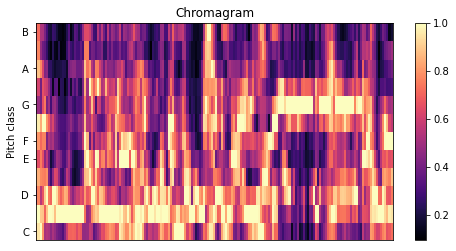

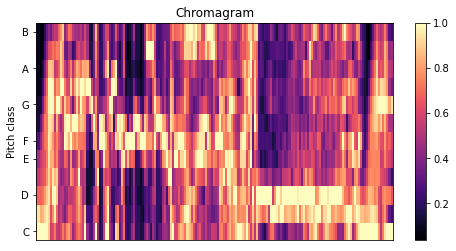

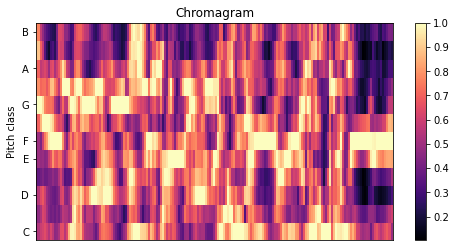

In [ ]:
## analyzing these sounds files using librosa chromagraphs
## small utility function to display different waveforms, spectograms etc
import matplotlib.pyplot as plt
import librosa.display
import librosa

def display_chromagraph(audio_file_path, ctr=1):
  y, sr = librosa.load(audio_file_path)
  plt.figure(figsize=(8, 4))
  C = librosa.feature.chroma_cqt(y=y, sr=sr)
  fig_ax = librosa.display.specshow(C, y_axis='chroma')
  plt.colorbar()
  plt.title('Chromagram')
  plt.savefig(f'{ctr}.png')
display_chromagraph(f'{base_storage_dir}/noisy_top_level_generation_{random_choices[0]}.wav')
display_chromagraph(f'{base_storage_dir}/noisy_top_level_generation_{random_choices[1]}.wav', ctr=2)
display_chromagraph(f'{base_storage_dir}/noisy_top_level_generation_{random_choices[2]}.wav', ctr=3)

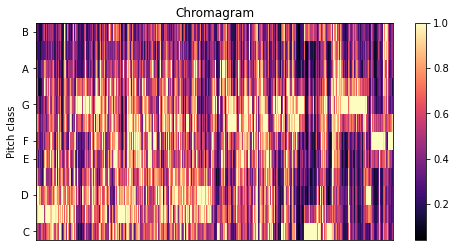

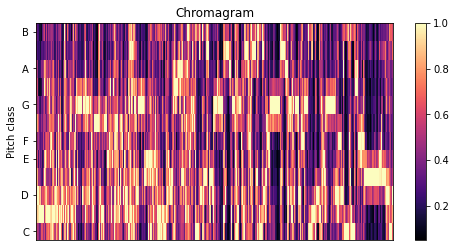

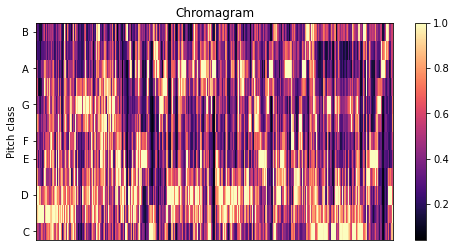

In [ ]:
# Top level continuation
display_chromagraph(f'{base_storage_dir}/top_level_continuation_{random_choices[0]}.wav', ctr=4)
display_chromagraph(f'{base_storage_dir}/top_level_continuation_{random_choices[1]}.wav', ctr=5)
display_chromagraph(f'{base_storage_dir}/top_level_continuation_{random_choices[2]}.wav', ctr=6)

Without listening to the audio, we can see that the chromagraphs show that the top level continuations are less noisy.

# Upsample Co-Composition to Higher Audio Quality

Choose your favorite sample from your latest group of generations.  (If you haven't already gone through the Co-Composition block, make sure to do that first so you have a generation to upsample).

In [ ]:
choice = random_choices[1]
select_best_sample = True

In [ ]:
if select_best_sample:
  zs[2]=zs[2][choice].repeat(zs[2].shape[0],1)

t.save(zs, base_storage_dir+'zs-top-level-final.t')

Note: If you are using a CoLab hosted runtime on the free tier, you may want to download this zs-top-level-final.t file, and then restart an instance and load it in the next cell.  The free tier will last a maximum of 12 hours, and the upsampling stage can take many hours, depending on how long a sample you have generated.

In [ ]:
if True:
  zs = t.load(base_storage_dir + 'zs-top-level-final.t')

assert zs[2].shape[1]>=2048, f'Please first generate at least 2048 tokens at the top level, currently you have {zs[2].shape[1]}'
hps.sample_length = zs[2].shape[1]*top_prior.raw_to_tokens

In [ ]:
# Set this False if you are on a local machine that has enough memory (this allows you to do the
# lyrics alignment visualization). For a hosted runtime, we'll need to go ahead and delete the top_prior
# if you are using the 5b_lyrics model.
if True:
  del top_prior
  empty_cache()
  top_prior=None

upsamplers = [make_prior(setup_hparams(prior, dict()), vqvae, 'cpu') for prior in priors[:-1]]

Conditioning on 1 above level(s)
Checkpointing convs
Checkpointing convs
Loading artist IDs from /usr/local/lib/python3.6/dist-packages/jukebox/data/ids/v2_artist_ids.txt
Loading artist IDs from /usr/local/lib/python3.6/dist-packages/jukebox/data/ids/v2_genre_ids.txt
Level:0, Cond downsample:4, Raw to tokens:8, Sample length:65536
Restored from /root/.cache/jukebox-assets/models/5b/prior_level_0.pth.tar
0: Loading prior in eval mode
Conditioning on 1 above level(s)
Checkpointing convs
Checkpointing convs
Loading artist IDs from /usr/local/lib/python3.6/dist-packages/jukebox/data/ids/v2_artist_ids.txt
Loading artist IDs from /usr/local/lib/python3.6/dist-packages/jukebox/data/ids/v2_genre_ids.txt
Level:1, Cond downsample:4, Raw to tokens:32, Sample length:262144
Restored from /root/.cache/jukebox-assets/models/5b/prior_level_1.pth.tar
0: Loading prior in eval mode


In [ ]:
sampling_kwargs = [dict(temp=.99, fp16=True, max_batch_size=14, chunk_size=32),
                    dict(temp=0.99, fp16=True, max_batch_size=14, chunk_size=32),
                    None]

if type(labels)==dict:
  labels = [prior.labeller.get_batch_labels(metas, 'cuda') for prior in upsamplers] + [labels]

This next step upsamples 2 levels.  The level_1 samples will be available after around one hour (depending on the length of your sample) and are saved under {hps.name}/level_0/item_0.wav, while the fully upsampled level_0 will likely take 4-12 hours. You can access the wav files down below, or using the "Files" panel at the left of this CoLab.

(Please note, if you are using this CoLab on Google's free tier, you may want to download intermediate steps as the connection will last for a maximum 12 hours.)

In [ ]:
print('HERE WE GO')
zs = upsample(zs, labels, sampling_kwargs, [*upsamplers, top_prior], hps)

HERE WE GO
Sampling level 1
Sampling 8192 tokens for [0,8192]. Conditioning on 0 tokens
Ancestral sampling 3 samples with temp=0.99, top_k=0, top_p=0.0
8192/8192 [13:56<00:00,  9.80it/s]
Sampling 8192 tokens for [4096,12288]. Conditioning on 4096 tokens
Primed sampling 3 samples with temp=0.99, top_k=0, top_p=0.0
128/128 [00:17<00:00,  7.42it/s]
4096/4096 [06:57<00:00,  9.80it/s]
Sampling 8192 tokens for [8192,16384]. Conditioning on 4096 tokens
Primed sampling 3 samples with temp=0.99, top_k=0, top_p=0.0
128/128 [00:17<00:00,  7.40it/s]
4096/4096 [06:56<00:00,  9.84it/s]
Sampling 8192 tokens for [12288,20480]. Conditioning on 4096 tokens
Primed sampling 3 samples with temp=0.99, top_k=0, top_p=0.0
128/128 [00:17<00:00,  7.46it/s]
4096/4096 [06:52<00:00,  9.92it/s]
Sampling 8192 tokens for [16384,24576]. Conditioning on 4096 tokens
Primed sampling 3 samples with temp=0.99, top_k=0, top_p=0.0
128/128 [00:17<00:00,  7.44it/s]
4096/4096 [06:54<00:00,  9.88it/s]
Sampling 8192 tokens for [2

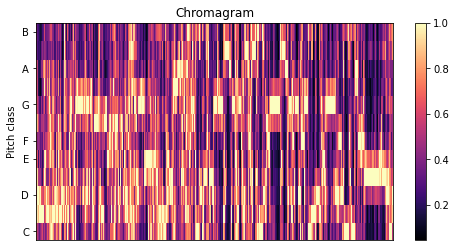

In [ ]:
import matplotlib.pyplot as plt
import librosa.display
import librosa

def display_chromagraph(audio_file_path, ctr=1):
  y, sr = librosa.load(audio_file_path)
  plt.figure(figsize=(8, 4))
  C = librosa.feature.chroma_cqt(y=y, sr=sr)
  fig_ax = librosa.display.specshow(C, y_axis='chroma')
  plt.colorbar()
  plt.title('Chromagram')
  plt.savefig(f'{ctr}.png')
display_chromagraph(f'{hps.name}/level_1/item_0.wav')